# FPE PII Detector

The FPE PII Detector is a tool for automatically detecting personally identifiable information (PII) in images. It uses a pre-trained model ([MegaDetector v5](https://github.com/microsoft/CameraTraps/blob/main/megadetector.md)) to detect PII in images and returns a JSON object with the results.

This notebook explains how the detector works, and the demonstrates the output format that is stored in the FPE database.

In [12]:
import os
from PytorchWildlife.models import detection
from PytorchWildlife import utils
from PIL import Image
from IPython.display import display
import json

## Set Up Detector

The FPE PII Detector uses a pre-trained model ([MegaDetector v5](https://github.com/microsoft/CameraTraps/blob/main/megadetector.md)) to detect PII in images. The model is loaded using the `detection.MegaDetectorV5()` class. The pre-trained weights can be downloaded ahead of time from the [MegaDetector GitHub repository for v5.0](https://github.com/microsoft/CameraTraps/releases/tag/v5.0).

```sh
mkdir -p model/
curl -LJO https://zenodo.org/records/13357337/files/md_v5a.0.0.pt?download=1
mv md_v5a.0.0.pt model/
```

The model is then loaded using the `detection.MegaDetectorV5()` class and specifying the pre-downloaded weights file.

In [13]:
detection_model = detection.MegaDetectorV5(weights="model/md_v5a.0.0.pt")

Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


## Single Image Detection

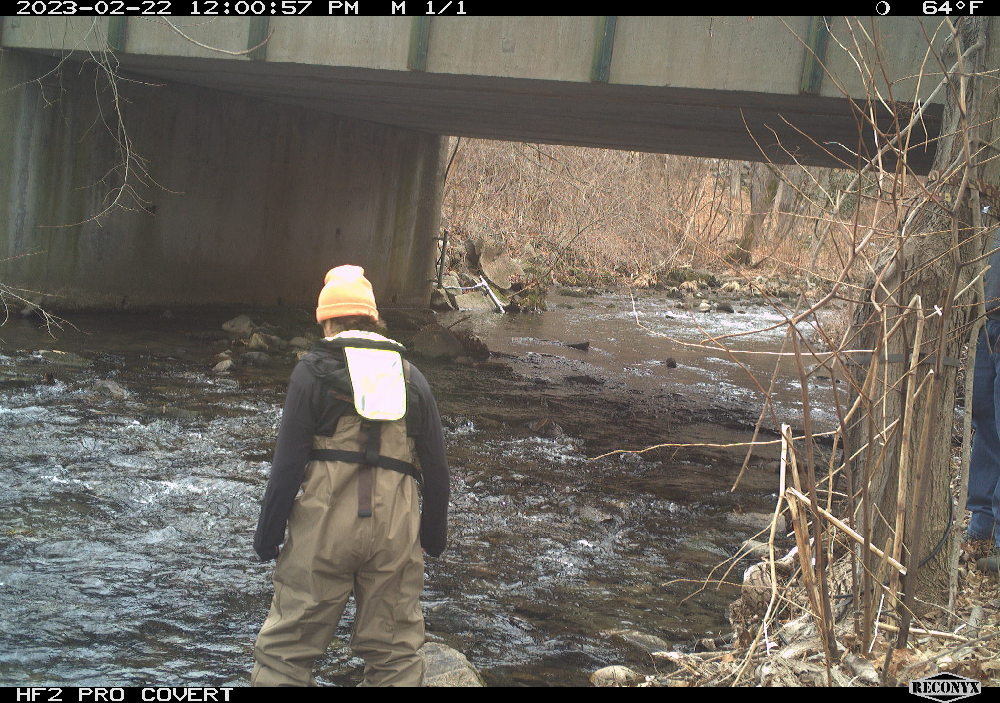

In [21]:
image_path = "data/input/person/West Brook 0__2023-02-22__12-00-57(8).JPG"
image = Image.open(image_path)
display(image)

Running the detection model on the image returns a dictionary with the results of the form:

```python
{
  'img_id': "data/input/person/West Brook 0__2023-02-22__12-00-57(8).JPG",
  'detections': Detections(
    xyxy=array([[100, 100, 200, 200], [300, 300, 400, 400]]),
    confidence=array([0.95, 0.90]),
    class_id=array([1, 1]),
    mask=None,
    tracker_id=None,
    data={}
  ),
  'labels': ['person 0.75', 'person 0.68']
}
```

Where the classes provided as integers with the following mapping:

In [22]:
detection_model.CLASS_NAMES

{0: 'animal', 1: 'person', 2: 'vehicle'}

To run the detection model on an image, use the `single_image_detection()` method:

In [23]:
md_detections = detection_model.single_image_detection(image_path)
md_detections

{'img_id': 'data/input/person/West Brook 0__2023-02-22__12-00-57(8).JPG',
 'detections': Detections(xyxy=array([[        511,         540,         923,        1407],
        [       1970,         392,        2048,        1181]], dtype=float32), mask=None, confidence=array([    0.96876,     0.56055], dtype=float32), class_id=array([1, 1]), tracker_id=None, data={}),
 'labels': ['person 0.97', 'person 0.56']}

A modified version of the image with the detections overlaid can be saved using the `save_detection_images()` method:

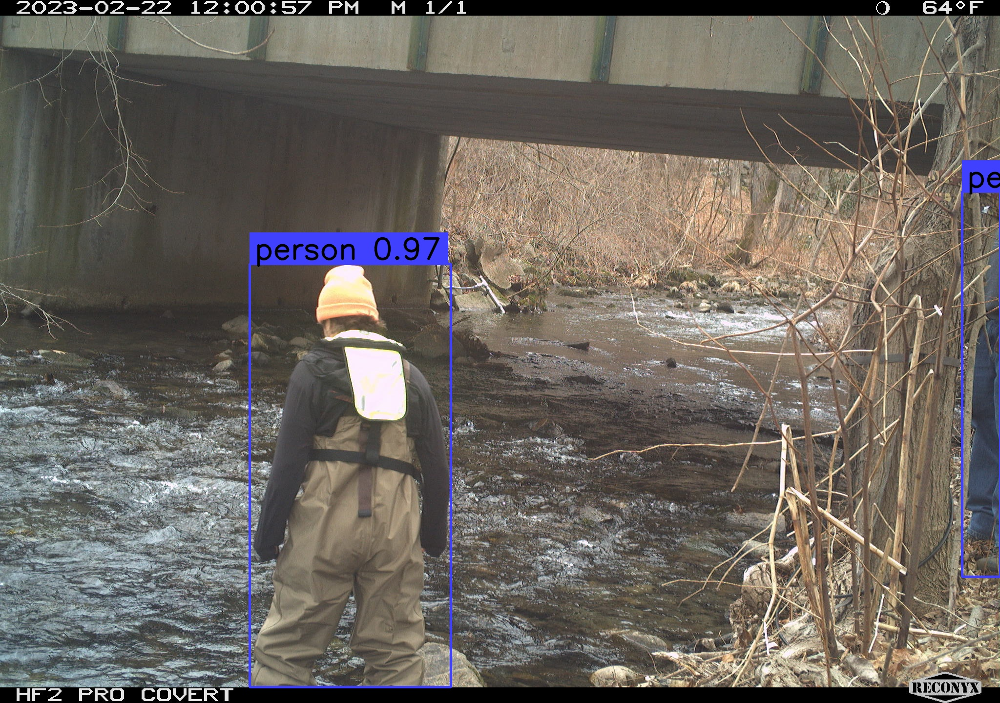

In [24]:
utils.save_detection_images(md_detections, "data/output/person")
image = Image.open(f"data/output/person/{os.path.basename(image_path)}")
display(image)

The detection results can also be saved to a JSON file using the `save_detection_json()` method:

In [25]:
json_filename = os.path.join("data/output/person/West Brook 0__2023-02-22__12-00-57(8).json")
utils.save_detection_json([md_detections], json_filename,
                          categories=detection_model.CLASS_NAMES,
                          exclude_category_ids=[],
                          exclude_file_path=None)

with open(json_filename, "r") as f:
    data = json.load(f)
data

{'annotations': [{'img_id': 'data/input/person/West Brook 0__2023-02-22__12-00-57(8).JPG',
   'bbox': [[511, 540, 923, 1407], [1970, 392, 2048, 1181]],
   'category': [1, 1],
   'confidence': [0.9687577486038208, 0.5605481863021851]}],
 'categories': {'0': 'animal', '1': 'person', '2': 'vehicle'}}

## Convert Results to FPE PII Format

The detection results can be converted to the FPE PII format using the `convert_md_detections_to_fpe_format()` method, which returns a dictionary of the format:

```json
{
  "file": "RCNX0001.JPG",
  "detections": [
    {
      "category": 1,
      "conf": 0.814,
      "bbox": [0.8305, 0.4157, 0.05908, 0.3411]
    }, {
      "category": 1,
      "conf": 0.91,
      "bbox": [0.7231, 0.421, 0.04785, 0.2795]
    }
  ],
  "max_conf": {
    "animal": 0,
    "person": 0.91,
    "vehicle": 0
  }
}
```

The `convert_md_detections_to_fpe_format()` method takes the MegaDetector v5 results for a single image and returns a dictionary in the FPE PII format. This results in this format are then combined for all images in the imageset, and uploaded to the S3 bucket in the imageset directory.

In [26]:
from fpe_pii_detector.utils import convert_md_detections_to_fpe_format

fpe_detections = convert_md_detections_to_fpe_format(md_detections)
fpe_detections

{'detections': [{'category': 1,
   'conf': 0.9687577486038208,
   'bbox': [511, 540, 923, 1407]},
  {'category': 1,
   'conf': 0.5605481863021851,
   'bbox': [1970, 392, 2048, 1181]}],
 'max_conf': {'animal': 0, 'person': 0.9687577486038208, 'vehicle': 0}}

The `convert_fpe_detections_to_db()` method is used to convert the FPE detections to the database row format:

```json
{
  "pii_animal": 0,    // max. confidence of animal detection
  "pii_person": 0.91, // max. confidence of person detection
  "pii_vehicle": 0,   // max. confidence of vehicle detection
  "pii_detections": [
    {
      "category": 1,
      "conf": 0.814,
      "bbox": [0.8305, 0.4157, 0.05908, 0.3411]
    }, {
      "category": 1,
      "conf": 0.91,
      "bbox": [0.7231, 0.421, 0.04785, 0.2795]
    }
  ]
}
```

In [27]:
from fpe_pii_detector.utils import convert_fpe_detections_to_db_format
convert_fpe_detections_to_db_format(fpe_detections)

{'pii_animal': 0,
 'pii_person': 0.9687577486038208,
 'pii_vehicle': 0,
 'pii_detections': [{'category': 1,
   'conf': 0.9687577486038208,
   'bbox': [511, 540, 923, 1407]},
  {'category': 1,
   'conf': 0.5605481863021851,
   'bbox': [1970, 392, 2048, 1181]}]}